In [ ]:
!pip install mahotas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install path to package/mahotas‑1.4.11‑cp36‑cp36m‑win_amd64.whl

ERROR: mahotas‑1.4.11‑cp36‑cp36m‑win_amd64.whl is not a valid wheel filename.


In [ ]:
!pip install numpy --upgrade
!pip install mahotas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import cv2 as cv
import sys
import os
import glob
import numpy as np
import mahotas as mt
from sklearn.svm import LinearSVC
from math import copysign, log10
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


-----------------Calculation of Humoments and Haralick features------------
/content/10c.jpg: 
3.06867
9.14442
13.27168
12.17515
25.43306
-16.75671
24.91792

/content/20c.jpg: 
3.07875
9.71304
14.21244
11.99419
26.36610
-16.91412
25.09814

/content/50c.jpg: 
3.08483
9.21657
13.57178
11.53819
24.37459
-16.16796
24.16260

/content/R1.jpg: 
3.02389
9.22819
12.30638
11.08407
23.16485
-15.78982
22.81960

/content/R2.jpg: 
3.08870
9.41949
12.57219
11.54082
24.94308
-16.82854
-23.59777

/content/R5.jpg: 
3.08227
9.54719
14.01593
11.53455
-24.30979
-16.31057
-27.31255

----------------------DONE Calculating Hu moments and haralick features------------------
----------Calculation of Hu Moments and feature extraction for input image--------------
/content/drive/MyDrive/TestInput/20c.jpg: 
3.07875
9.71304
14.21244
11.99419
26.36610
-16.91412
25.09814

/content/drive/MyDrive/TestInput/10c.jpg: 
3.06867
9.14442
13.27168
12.17515
25.43306
-16.75671
24.91792

--------------------------------End of ca

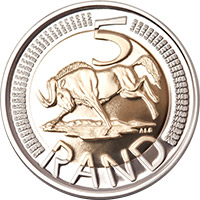

(200, 200)
Processing Image - 2 in R5


<ipython-input-85-452545da992d>:187: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 2)


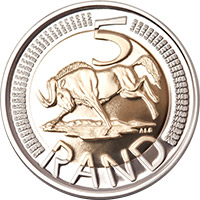

(200, 200)
Processing Image - 1 in R1


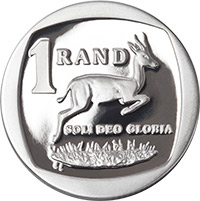

(201, 200)
Processing Image - 1 in 10c


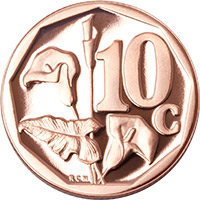

(200, 200)
Processing Image - 1 in 20c


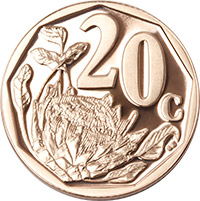

(201, 200)
Processing Image - 1 in 50c


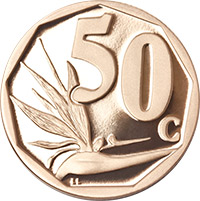

(201, 200)
Processing Image - 1 in R2


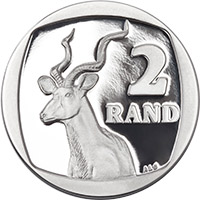

(200, 200)
Training features: [[ 3.99357634e-02  1.85219397e+03  7.79155560e-01  4.19261941e+03
   3.02574315e-01  4.07945344e+02  1.49182837e+04  7.18276233e+00
   1.08591032e+01  2.77483631e-04  5.48878176e+00 -2.29059225e-01
   9.68894092e-01  3.99357634e-02  1.85219397e+03  7.79155560e-01
   4.19261941e+03  3.02574315e-01  4.07945344e+02  1.49182837e+04
   7.18276233e+00  1.08591032e+01  2.77483631e-04  5.48878176e+00
  -2.29059225e-01  9.68894092e-01  4.64105016e-02  1.21063769e+03
   8.82254806e-01  5.14001298e+03  3.52063812e-01  3.85723315e+02
   1.93494142e+04  7.24529613e+00  1.06561777e+01  3.76118385e-04
   4.93026044e+00 -3.04811716e-01  9.88715687e-01  3.30705042e-02
   1.09700741e+03  8.76212255e-01  4.43003081e+03  3.07530999e-01
   4.00330588e+02  1.66231158e+04  7.38417067e+00  1.10551914e+01
   2.92962837e-04  5.13963273e+00 -2.80305350e-01  9.85733170e-01
   2.59633214e-02  1.70244710e+03  7.87186756e-01  3.99921690e+03
   2.64211182e-01  4.02078611e+02  1.42944205e

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


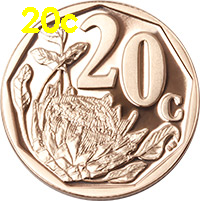

Prediction - 10c


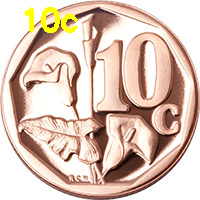

/usr/local/lib/python3.10/dist-packages/matplotlib/image.py:484: RuntimeWarning: invalid value encountered in subtract
  A_scaled -= a_min


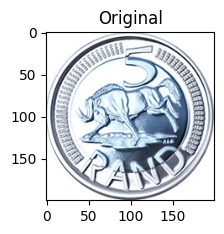

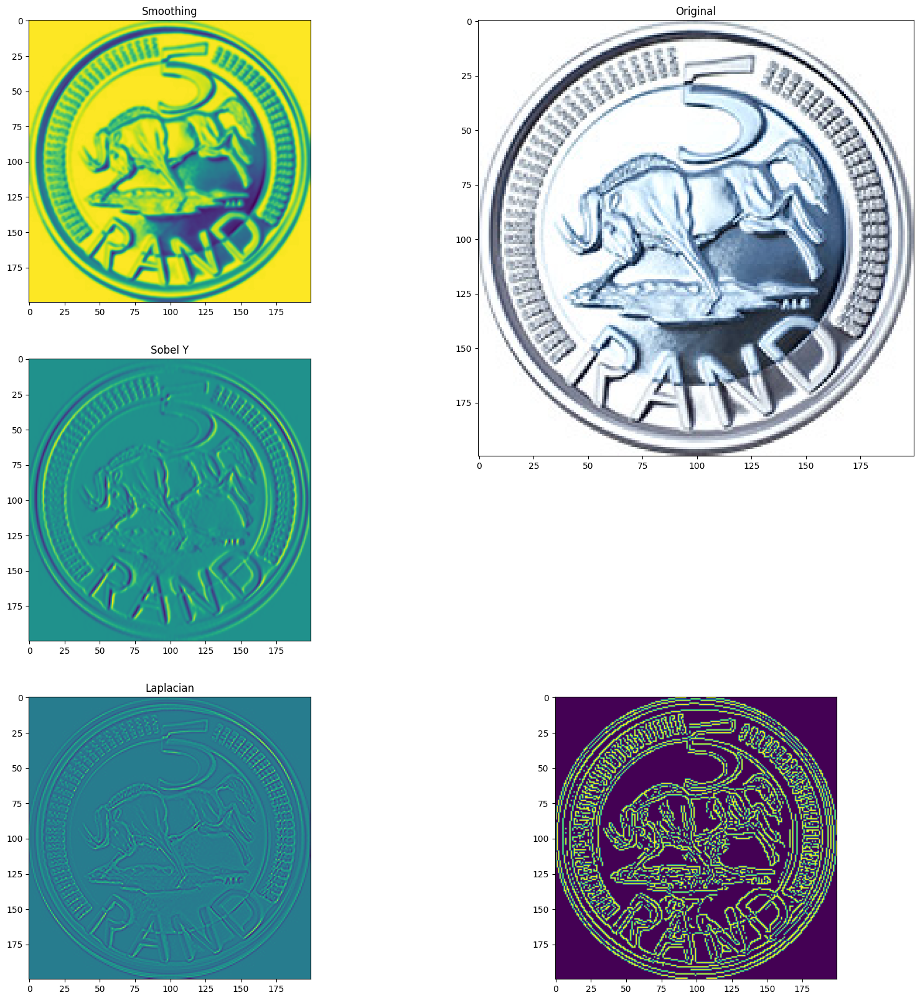

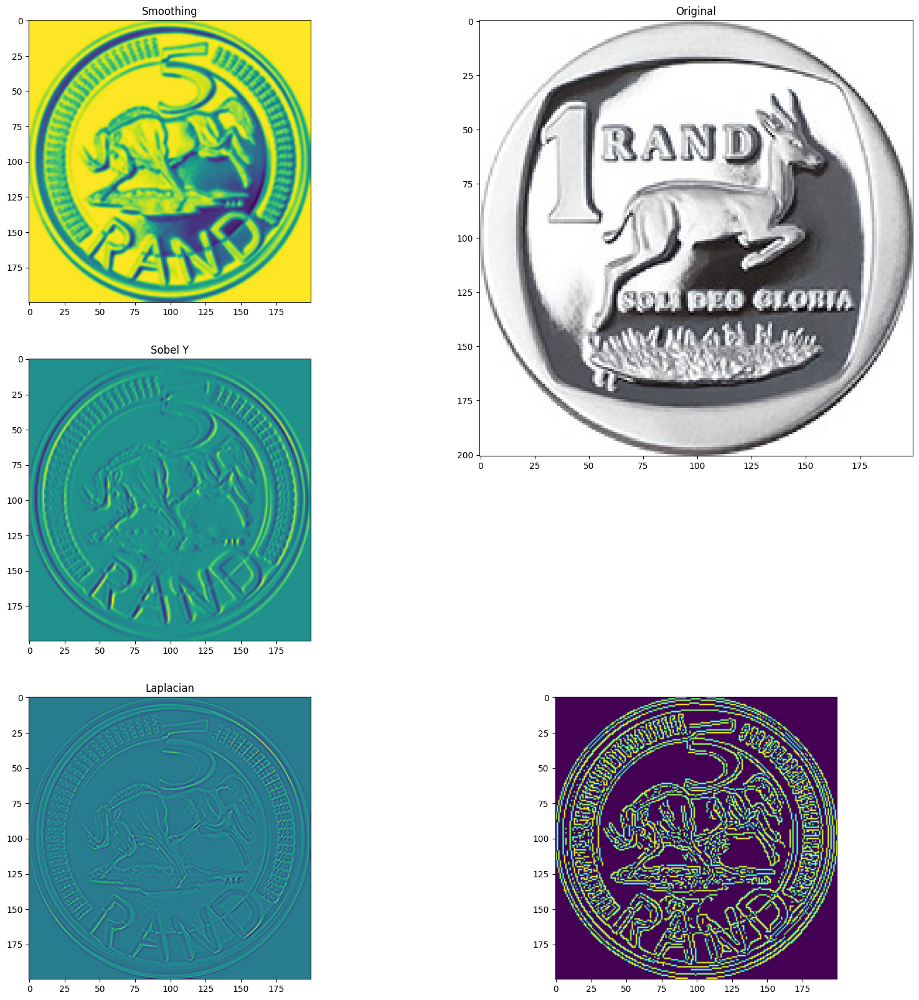

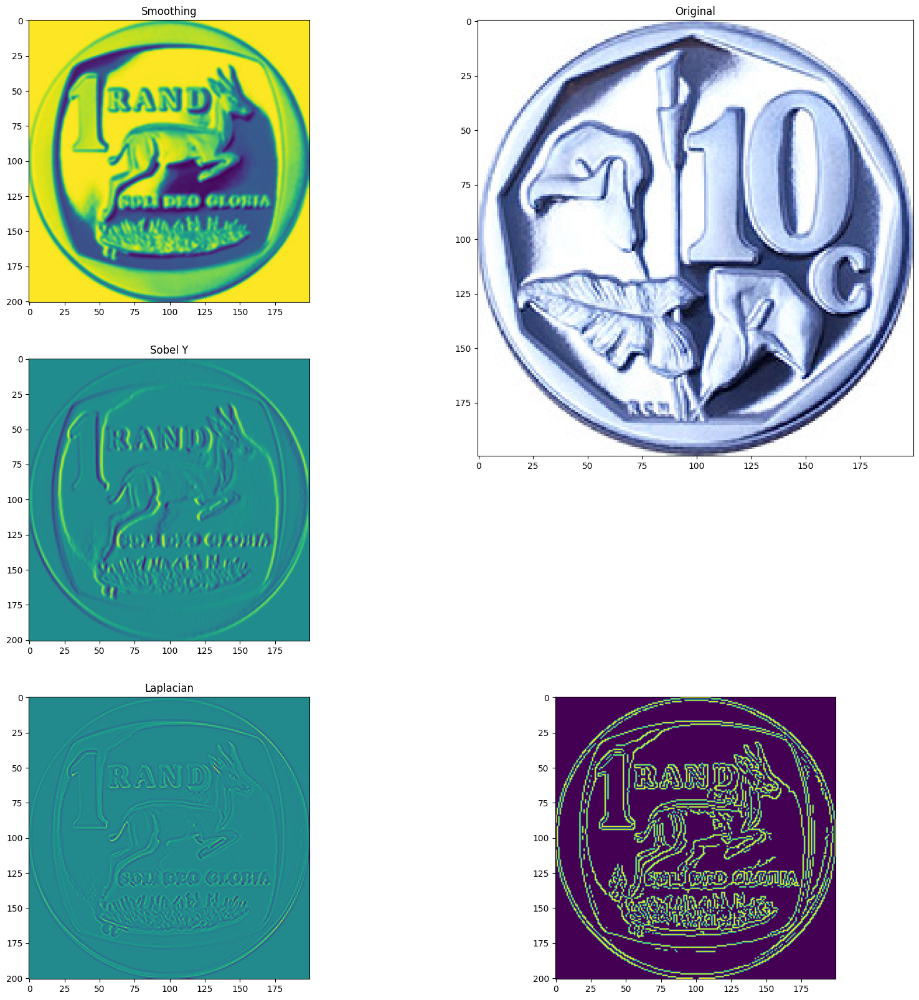

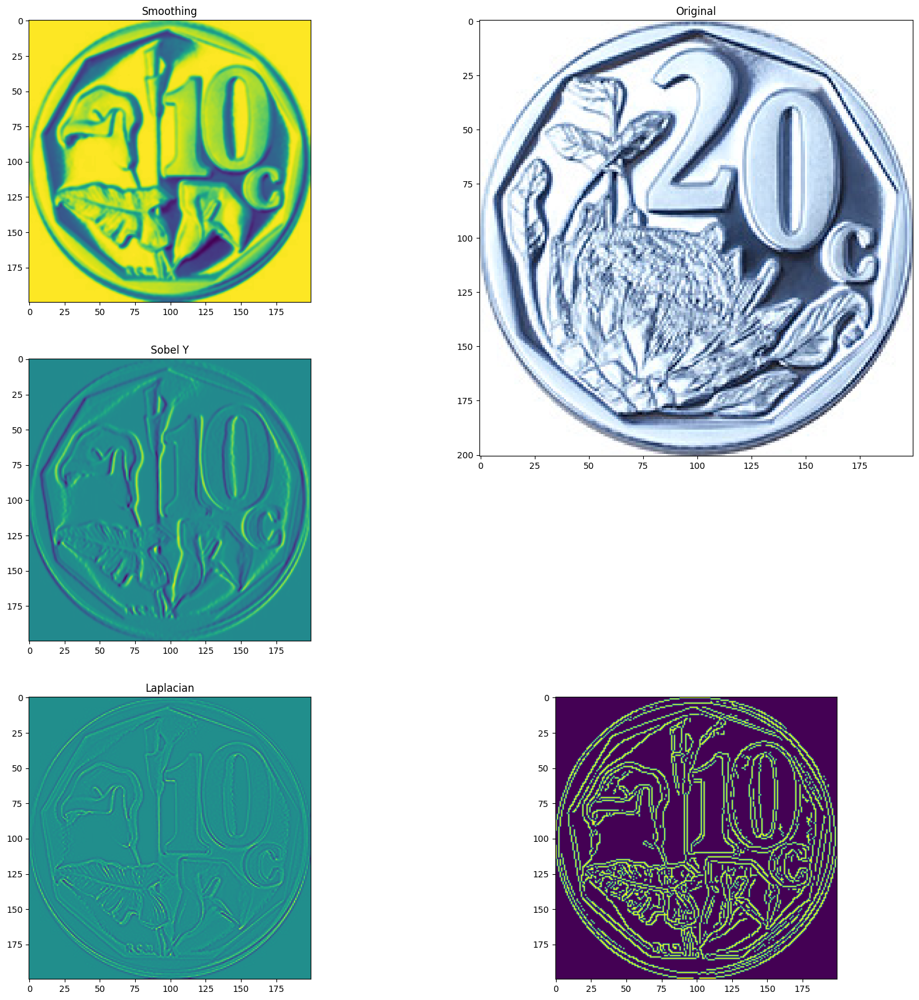

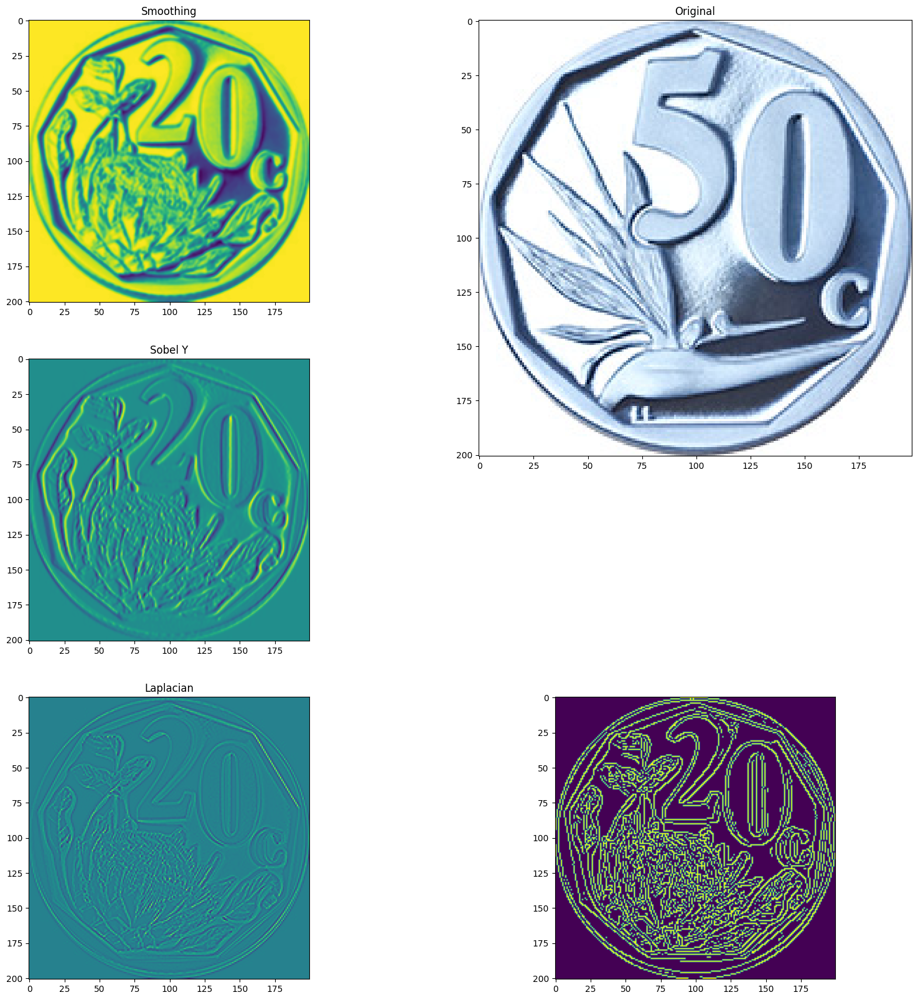

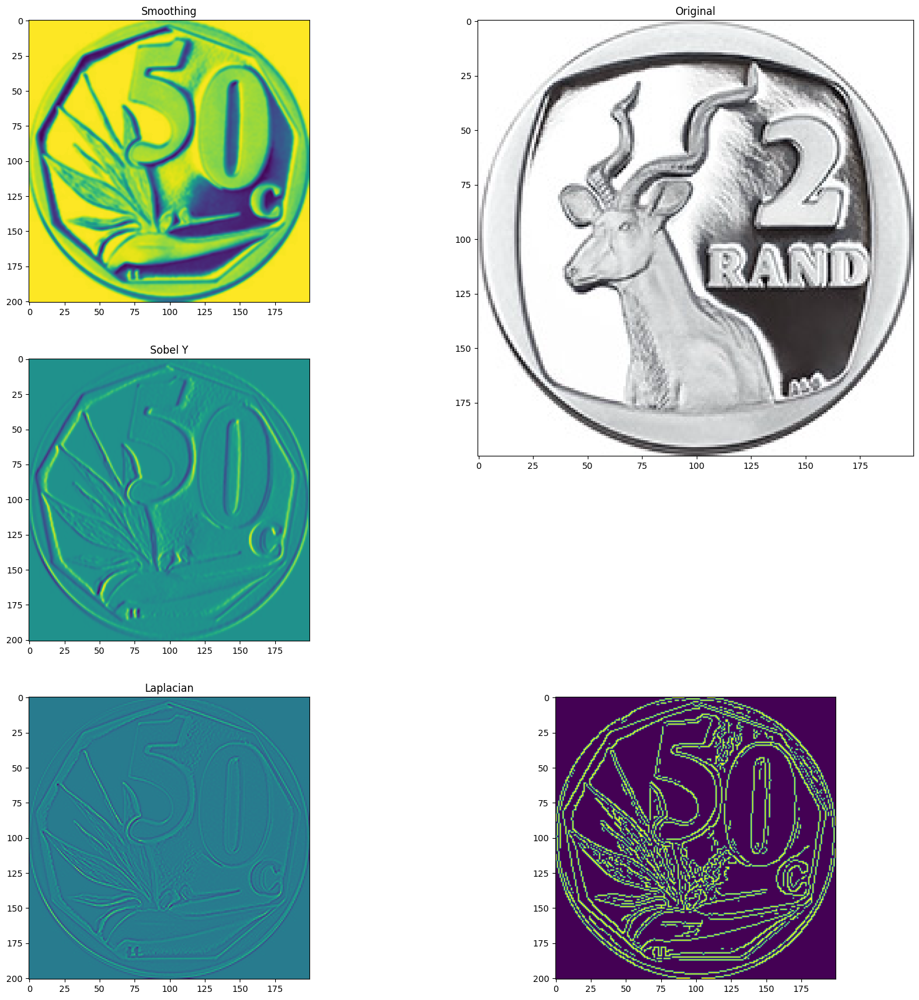

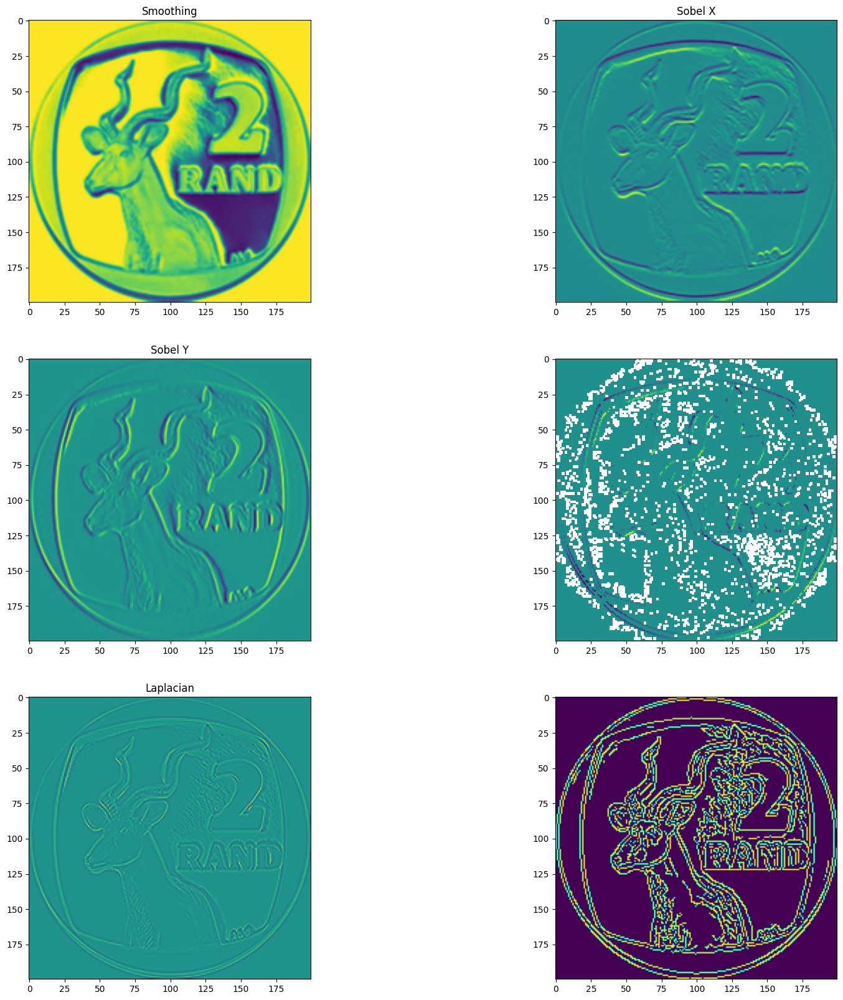

In [ ]:

# function to compute histogram equalization
def histogram_equalization(Image):
    Image_Height = Image.shape[0]
    Image_Width = Image.shape[1]

    Histogram = np.zeros([256], np.int32)

    for x in range(0, Image_Height):
        for y in range(0, Image_Width):
            Histogram[Image[x, y]] += 1

    return Histogram


# function to extract haralick textures from an image
def extract_features(image1):
    # calculate haralick texture features for 4 types of adjacency

    textures = mt.features.haralick(image1)

    # take the mean of it and return it
    ht_mean = textures.mean(axis=0)
    return ht_mean


def main():
    print("-----------------Calculation of Humoments and Haralick features------------")
    sample_vector = []
    feature_vector1 = [[]]
    showLogTransformedHuMoments = True
    p = ""
    a1 = "/content/10c.jpg"
    a2 = "/content/20c.jpg"
    a3 = "/content/50c.jpg"
    a4 = "/content/R1.jpg"
    a5 = "/content/R2.jpg"
    a6 = "/content/R5.jpg"


    for i in range(6):

        if i == 0:
            p = a1
        elif i == 1:
            p = a2
        elif i == 2:
            p = a3
        elif i == 3:
            p = a4
        elif i == 4:
          p = a5
        else:
            p = a6
        path = glob.glob(p)

        for img in path:

            filename = img
            im = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
            _, im = cv2.threshold(im, 128, 255, cv2.THRESH_BINARY)
            moment = cv2.moments(im)
            huMoments = cv2.HuMoments(moment)
            print("{}: ".format(filename))


            sample_features = extract_features(im)
            for k in range(len(sample_features)):
                sample_vector.append(sample_features[k])

            for i in range(0, 7):
                if showLogTransformedHuMoments:
                    # Log transform Hu Moments to make
                    # squash the range
                    print("{:.5f}".format(-1 * copysign(1.0, huMoments[i]) * log10(abs(huMoments[i]))))
                    sample_vector.append(-1 * copysign(1.0, huMoments[i]) * log10(abs(huMoments[i])))
                else:
                    # Hu Moments without log transform
                    print("{:.5f}".format(huMoments[i]))
                    sample_vector.append(-1 * copysign(1.0, huMoments[i]) * log10(abs(huMoments[i])))
            print()

            feature_vector1.append(sample_vector)
            sample_vector = []

    print("----------------------DONE Calculating Hu moments and haralick features------------------")

    #print(feature_vector1[2])  # vector to contain all the features from hu moments and harakick

    print("----------Calculation of Hu Moments and feature extraction for input image--------------")
    '''
    let us now calculate the input image hu-moments and haralick features
    '''
    #showLogTransformedHuMoments2 = True
    path = glob.glob("/content/drive/MyDrive/TestInput"+ "/*.jpg")
    input_vector = []
    feature_vector2 = []
    for img in path:

        filename = img
        im = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
        _, im = cv2.threshold(im, 128, 255, cv2.THRESH_BINARY)
        moment = cv2.moments(im)
        huMoments = cv2.HuMoments(moment)
        print("{}: ".format(filename))

        input_features = extract_features(im)
        for k in range(len(input_features)):
            input_vector.append(input_features[k])

        for i in range(0, 7):
            if showLogTransformedHuMoments:
                # Log transform Hu Moments to make
                # squash the range
                print("{:.5f}".format(-1 * copysign(1.0, huMoments[i]) * log10(abs(huMoments[i]))))
                input_vector.append(-1 * copysign(1.0, huMoments[i]) * log10(abs(huMoments[i])))
            else:
                # Hu Moments without log transform
                print("{:.5f}".format(huMoments[i]))
                input_vector.append(-1 * copysign(1.0, huMoments[i]) * log10(abs(huMoments[i])))
        print()
    print("--------------------------------End of calculation---------------------------------------------------")

    for i in input_vector:
        feature_vector2.append(i)

    print("-----------------------------------Feature vector-------------------------------------------------------")
    print(feature_vector2)

    print("-----------------------------------Feature vector-------------------------------------------------------")

    found = True
    count = 0
    v1 = []
    v2 = []
    i = 0

    while i < len(feature_vector1):

        for j in feature_vector1[i]:
            v1.append(j)
        for k in feature_vector2:
            v2.append(k)
        print("------------------------v1-- 20 Features from the dataset image----------------")
        print(v1)

        print(v2)
        print("------------------------v2 -- 20 Features from the Input image ------------------")
        if len(v1) > 0:

            for c in range(20):
                if v1[c] == v2[c]:
                    count = count + 1

        if count == 21:
            found = True
            print("Image found !!!!!!")
            break
        count = 1
        i = i + 1
        v1 = []
        v2 = []

    '''
    In the following operation we try to put a label on the output image
    '''
    print("--------------Linear SVM Classifier-----------------------------")

    # load the training dataset
    train_path = "/content/drive/MyDrive/SA Rands"
    train_names = os.listdir(train_path)

    # empty list to hold feature vectors and train labels
    train_features = []
    train_labels = []

      # loop over the training dataset
    print( "[STATUS] Started extracting haralick textures..")
    for train_name in train_names:
        cur_path = train_path + "/" + train_name
        cur_label = train_name
        i = 1

        for file1 in glob.glob(cur_path + "/*.jpg"):
            print( "Processing Image - {} in {}".format(i, cur_label))
            # read the training image
            image = cv2.imread(file1)
            plt.subplot(2, 2, 2)
            plt.title("Original image")
            plt.imshow(image)
            # convert the image to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            plt.subplot(2, 2, 2)
            plt.title("Grey image")
            plt.imshow(gray)
            #We can add some Guassian Smoothing inorder to remove noise
            cv2_imshow(image)
            plt.title("Original")
            plt.imshow(image)
            #Edge detection
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            print(image.shape)
            h,w = image.shape
            # Sobel Edges
            x_sobel = cv.Sobel(image, cv.CV_64F, 0, 1, ksize=3) #We can try with kernal size 3 and 5
            y_sobel = cv.Sobel(image, cv.CV_64F, 1, 0, ksize=3)
            plt.figure(figsize=(20, 20))


            #Smoothing
            img2 = cv.GaussianBlur(image, (3, 3), 0,cv.BORDER_DEFAULT)
            plt.subplot(3, 2, 1)
            plt.title("Smoothing")
            plt.imshow(img2)

            plt.subplot(3, 2, 2)
            plt.title("Sobel X")
            plt.imshow(x_sobel)
            plt.subplot(3, 2, 3)
            plt.title("Sobel Y")
            plt.imshow(y_sobel)
            sobel_or = cv.bitwise_or(x_sobel, y_sobel)
            plt.subplot(3, 2, 4)
            plt.imshow(sobel_or)

            laplacian = cv.Laplacian(image, cv.CV_64F)
            plt.subplot(3, 2, 5)
            plt.title("Laplacian")
            plt.imshow(laplacian)

            #testing the threshold if the gradient is bigger that V2 then it's is an edge
            # if gradient is smaller that v1 not an edge

            canny = cv.Canny(image, 50, 120)
            plt.subplot(3, 2, 6)
            plt.imshow(canny)

            # extract haralick texture from the image
            features = extract_features(gray)
            # append the feature vector and label
            train_features.append(features)
            train_labels.append(cur_label)


            # show loop update
            i += 1
    # have a look at the size of our feature vector and labels
    print ("Training features: {}".format(np.array(train_features).reshape(1, -1)))
    print ("Training labels: {}".format(np.array(train_labels).reshape(1, -1)))

    # create the classifier
    print ("[STATUS] Creating the classifier..")

    clf_svm = LinearSVC(max_iter=5000, random_state=9)


    # fit the training data and labels
    print( "[STATUS] Fitting data/label to model..")

    clf_svm.fit(train_features, train_labels)

    # loop over the test images
    test_path = "/content/drive/MyDrive/TestInput"
    for file1 in glob.glob(test_path+ "/*.jpg"):
        # read the input image
        image = cv2.imread(file1)


        # convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


        # extract haralick texture from the image
        features = extract_features(gray)


        if found:
            # evaluate the model and predict label
            prediction = clf_svm.predict(features.reshape(1, -1))[0]

            # show the label
            cv2.putText(image, prediction, (20, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 3)

            print ("Prediction - {}".format(prediction))
            # display the output image
            cv2_imshow(image)
            cv2.waitKey(0)

        else:

            # show the label
            results = "image not found"
            cv2.putText(image, results, (20, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 3)
            print("Prediction - {}".format(results))
            # display the output image)
            cv2_imshow(image)
            cv2.waitKey(0)




if __name__ == "__main__":
    main()
